# Recommendations Systems
## Homework 2: Content Based Recommendations 
**By Millis Sahar** (approved by Asi)

<br>

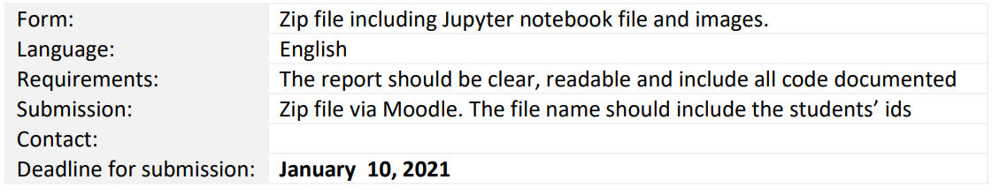

<br>

Students will form teams of two people each, and submit a single homework for each team.   
The same score for the homework will be given to each member of the team.  


Submit your solution in the form of an <a href='https://www.cs.bgu.ac.il/~elhadad/nlp17/notebooks.html'>Jupyter notebook file</a> (with extension ipynb).  
Images of graphs or tables should be submitted as PNG or JPG files.   
The code used to answer the questions should be included, runnable and documented in the notebook. Python 3.6 should be used.


The goal of this homework is to let you understand the details of content based recommender systems and its pros\cons comparing to other recommender system approaches.  
Implementation examples are presented in the Movielens_content_meta and Movielens_content_text notebooks in Moodle.


**Submission:**  
Submission of the homework will be done via Moodle by uploading a zip file containing a
Jupyter notbook and images.  
The deadline for submission of Homework 1 is set to January 10, 2021 end of day Israel.  
The homework needs to be entirely in English.   


We will use the same dataset we used for exercise #1 <a href='https://grouplens.org/datasets/movielens/100k/'>MovieLens 100K rating dataset</a> .   
Split your dataset to train and test.    
You can use the built-in splits included in the dataset.

<br><br><br><br>


### Final Results 

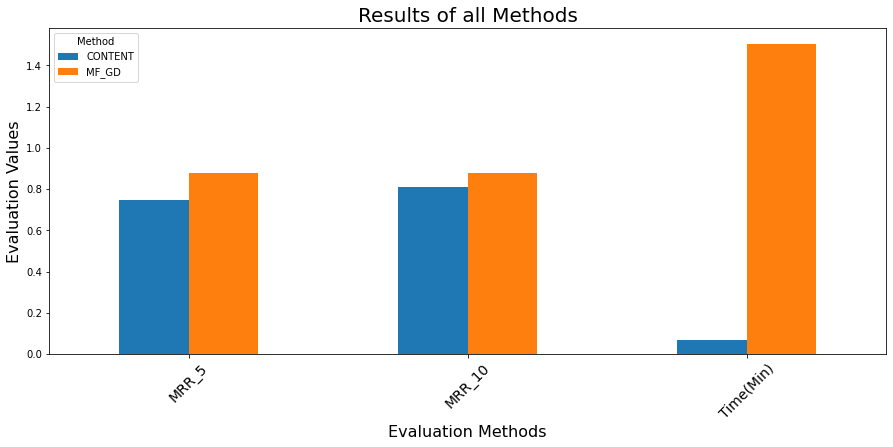

<br>
* if you run this notebook, some markdown notes will be irelavent

<br><br><br>
<br><br><br>
<br><br><br>

**Imports**

In [1]:
import time

# general
import warnings
import numpy as np
import scipy as sp
import pandas as pd

# visual
import seaborn as sns
import wordcloud as wc
import matplotlib.pyplot as plt
import matplotlib.ticker as tck

# visual 3D
from mpl_toolkits import mplot3d

# logic
from sklearn.metrics import mean_squared_error as MSE
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.feature_extraction.text import CountVectorizer
from scipy.spatial.distance import cosine

# notebook
from IPython.display import display, HTML


**Hide Warnings**

In [2]:
warnings.filterwarnings('ignore')

**Disable Autoscrolling**

In [3]:
%%javascript
IPython.OutputArea.prototype._should_scroll = function(lines) {
    return false;
};

<IPython.core.display.Javascript object>

<br><br><br>
### Download the MovieLens 100K rating dataset.

In [4]:
# download and extract to dir

link_movielens100k = 'http://files.grouplens.org/datasets/movielens/ml-100k.zip'
data_dir = 'ml-100k/'

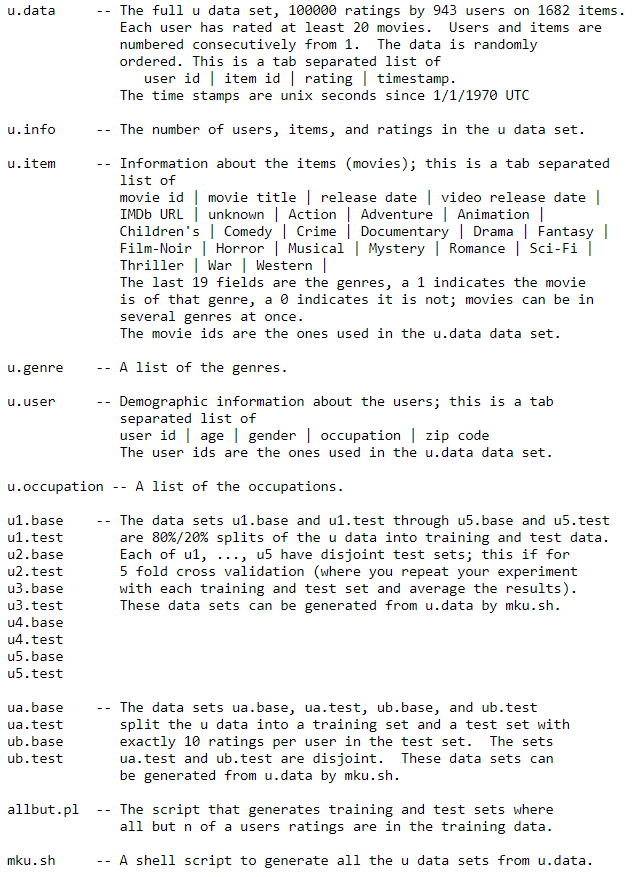

**Columns Names**

In [5]:
cols_data = ['user_id','item_id','rating','timestamp']
cols_user = ['user_id','age','gender','occupation','zip code']
cols_item = ['movie id','movie_title','release_date','video_release_date','IMDb_URL','unknown','Action','Adventure','Animation',
             'Childrens','Comedy','Crime','Documentary','Drama','Fantasy','Film_Noir','Horror','Musical','Mystery','Romance',
             'Sci_Fi','Thriller','War','Western']

**Read users data file**

In [6]:
df_users = pd.read_csv(data_dir + 'u.user',delimiter='|', header=None,names=cols_user)
df_users.shape

(943, 5)

**Read items(movies) data file**

In [7]:
df_items = pd.read_csv(data_dir + 'u.item',delimiter='|', header=None,names=cols_item,encoding="ISO-8859-1")
df_items.shape

(1682, 24)

**Read rating data file**

In [8]:
df_ratings = pd.read_csv(data_dir + 'u.data',delimiter='\t', header=None,names=cols_data)
df_ratings.shape

(100000, 4)

**Making sure shapes are mathing the info data file**

In [9]:
open(data_dir + 'u.info').readlines()

['943 users\n', '1682 items\n', '100000 ratings\n']

<br><br><br><br>
### Data Exploration - in HW1 notebook
I already analyzed the dataset on the first assignment, so I'll skip on the exploration this time :)  

*convert to Matrix:*

In [10]:
ratings = df_ratings.pivot(index = 'user_id', columns ='item_id', values = 'rating').fillna(0)
ratings.head()

item_id,1,2,3,4,5,6,7,8,9,10,...,1673,1674,1675,1676,1677,1678,1679,1680,1681,1682
user_id,,,,,,,,,,,,,,,,,,,,,
1,5.0,3.0,4.0,3.0,3.0,5.0,4.0,1.0,5.0,3.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,4.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


<br><br><br><br>

In [11]:
df_ratings.head()

,user_id,item_id,rating,timestamp
0,196,242,3,881250949
1,186,302,3,891717742
2,22,377,1,878887116
3,244,51,2,880606923
4,166,346,1,886397596


In [12]:
df_items.head()

,movie id,movie_title,release_date,video_release_date,IMDb_URL,unknown,Action,Adventure,Animation,Childrens,...,Fantasy,Film_Noir,Horror,Musical,Mystery,Romance,Sci_Fi,Thriller,War,Western
0,1,Toy Story (1995),01-Jan-1995,NaN,http://us.imdb.com/M/title-exact?Toy%20Story%2...,0,0,0,1,1,...,0,0,0,0,0,0,0,0,0,0
1,2,GoldenEye (1995),01-Jan-1995,NaN,http://us.imdb.com/M/title-exact?GoldenEye%20(...,0,1,1,0,0,...,0,0,0,0,0,0,0,1,0,0
2,3,Four Rooms (1995),01-Jan-1995,NaN,http://us.imdb.com/M/title-exact?Four%20Rooms%...,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
3,4,Get Shorty (1995),01-Jan-1995,NaN,http://us.imdb.com/M/title-exact?Get%20Shorty%...,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,5,Copycat (1995),01-Jan-1995,NaN,http://us.imdb.com/M/title-exact?Copycat%20(1995),0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0


In [13]:
df_users.head()

,user_id,age,gender,occupation,zip code
0,1,24,M,technician,85711
1,2,53,F,other,94043
2,3,23,M,writer,32067
3,4,24,M,technician,43537
4,5,33,F,other,15213


<br><br><br>
<br><br><br>
## Question 1: Item Similarity (40 points)

<br><br>

*a. Build a movie profile vector based on the item features of your choice. Suggested options: item genres, item title.*

In [14]:
irelevent_cols = ['movie id','movie_title','release_date','video_release_date','IMDb_URL','unknown']
movies_profile = df_items.drop(irelevent_cols,axis=1)
# movies_profile.index += 1
movies_profile

,Action,Adventure,Animation,Childrens,Comedy,Crime,Documentary,Drama,Fantasy,Film_Noir,Horror,Musical,Mystery,Romance,Sci_Fi,Thriller,War,Western
0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0
1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
3,1,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1677,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
1678,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0
1679,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0
1680,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0


*b. Build a function which provides the 5 most similar items to a specific item. Item to item similarity is calculated using the cosine similarity metric.*

In [15]:
def get_similar_items(movies_profile,item_id,n=5,no_self=True):
    
    # get a cosine similarity on all items
    cs_matrix = cosine_similarity(movies_profile)
    
    # remove the actual item
    if no_self:
        cs_matrix[item_id,item_id] = -1 
    else:
        n += 1
    
    
    # get the N-ids with the highest similarity
    cs_highest_ids  = cs_matrix[item_id].argsort()[::-1][:n]
    
    # get the similarity values
    cs_highest_values = cs_matrix[item_id][cs_highest_ids]
    
    return cs_highest_ids,cs_highest_values

*c. Use the above function to find most similar items for 2 items from the dataset. Explain your results.*

In [15]:
# created a helper function
def get_similar_and_explain(movies_profile,item_id,with_self = False):
    cols_not_present = ['movie id','release_date','video_release_date','IMDb_URL','unknown']
    
    ids,vs = get_similar_items(movies_profile,item_id,no_self=False)

    result = df_items.iloc[ids].drop(cols_not_present,axis=1)
    
    result.insert(0, 'similar_score',vs)
    
    return result

<br><br><br>

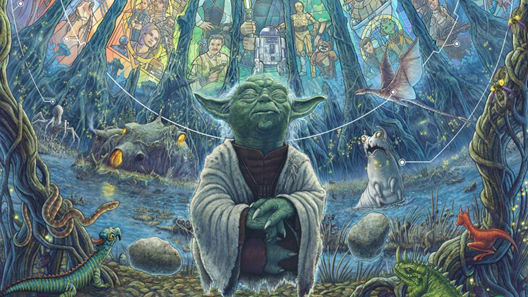

In [674]:
StarWars = 49
get_similar_and_explain(movies_profile,StarWars)

,similar_score,movie_title,Action,Adventure,Animation,Childrens,Comedy,Crime,Documentary,Drama,Fantasy,Film_Noir,Horror,Musical,Mystery,Romance,Sci_Fi,Thriller,War,Western
49,1.000000,Star Wars (1977),1,1,0,0,0,0,0,0,0,0,0,0,0,1,1,0,1,0
180,1.000000,Return of the Jedi (1983),1,1,0,0,0,0,0,0,0,0,0,0,0,1,1,0,1,0
171,0.912871,"Empire Strikes Back, The (1980)",1,1,0,0,0,0,0,1,0,0,0,0,0,1,1,0,1,0
270,0.894427,Starship Troopers (1997),1,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0
497,0.894427,"African Queen, The (1951)",1,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0
240,0.774597,"Last of the Mohicans, The (1992)",1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0


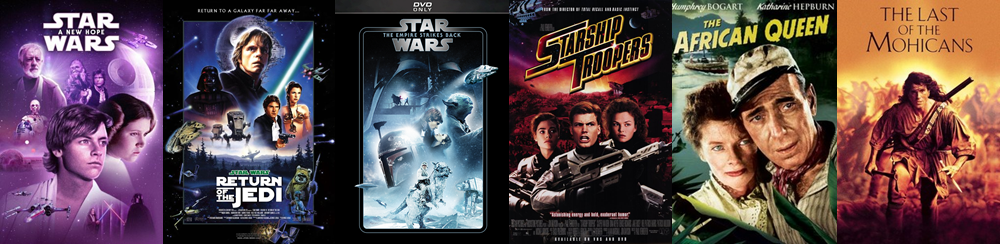

Great...  
The movie *Star Wars (1977)* is very similar to *Return of the Jedi (1983)*, and the rest of them.  

But, the 5th movie *African Queen*  is not similar (content wise) *Star Wars* .   
And this shows the disadvantage of this feature vector, that based only on genres. It's probably too generic.

<br><br>

<br><br>
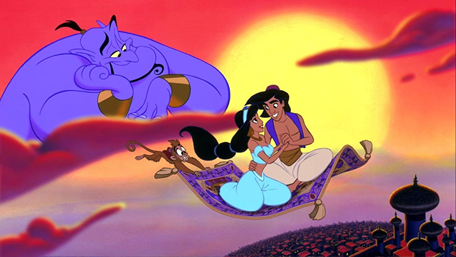

In [675]:
Aladin = 94
get_similar_and_explain(movies_profile,Aladin)

,similar_score,movie_title,Action,Adventure,Animation,Childrens,Comedy,Crime,Documentary,Drama,Fantasy,Film_Noir,Horror,Musical,Mystery,Romance,Sci_Fi,Thriller,War,Western
94,1.000000,Aladdin (1992),0,0,1,1,1,0,0,0,0,0,0,1,0,0,0,0,0,0
992,0.894427,Hercules (1997),0,1,1,1,1,0,0,0,0,0,0,1,0,0,0,0,0,0
0,0.866025,Toy Story (1995),0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0
419,0.866025,Alice in Wonderland (1951),0,0,1,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0
595,0.866025,"Hunchback of Notre Dame, The (1996)",0,0,1,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0
587,0.866025,Beauty and the Beast (1991),0,0,1,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0


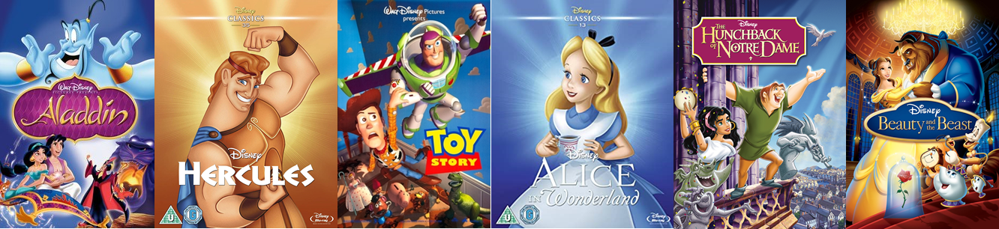

<br>

Awesome...  
As we can see, the vector of the genres are almost the same.    
Also, these movies are actualy very much similar from any person's point of view.  

But, as we can see the last 3 movies has the same similarity score.  
This is anothor disadvantage of this method while using this kind of feature vector.We should want to create a better representation of the movies.

<br><br><br><br>

*d. Use the matrix factorization item representation you built in exercise 1 to find the most similar items for the same 2 items you used above. Compare between the results.*

<br><br><br>
**From my HW1-MF notebook:**
Following Asi's instruction on the forum, I'm just gettign the "results" from HW1.

Please notice that it might be possible that i need to train my MF model for more epochs. But for this exercise I used only 15 epochs. Also, from run to run, I get somewhat different results.


<br><br>
**Star Wars (1977)**




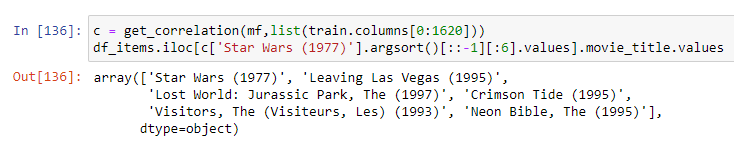


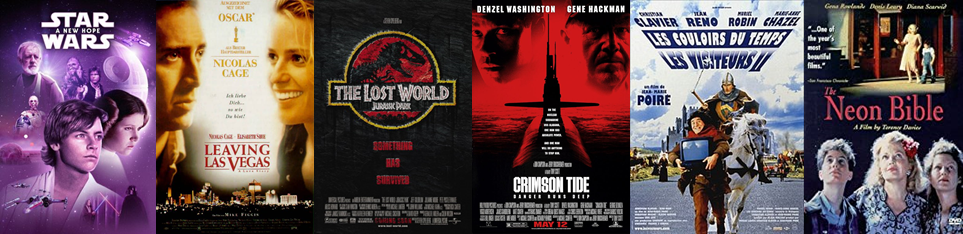

I can't actualy state that these movies are the same, but I can "feel" the connection, as for the same type of people would watch tese kind of view, and there for rate them.
But, regarding the content of the movie, they are not alike.  
Altough, It does looks like the same users (adults) would rate these movies. 


<br><br><br><br>
**Aladdin (1992)**

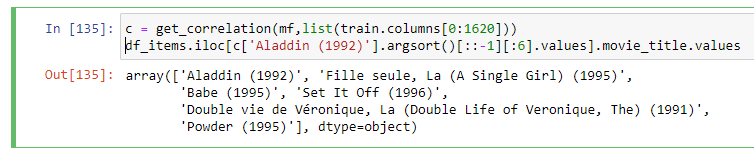
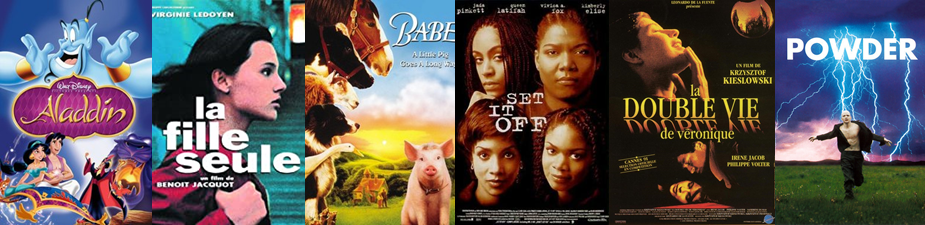

Here I can't see the similarity at all.  
Not by viewers or content wise to the Aladdin movie (except fot the Aladdin itself obviosly).

<br><br><br>

BTW this is a good senity check that my MF model does not perform as good as I hoped. But this it's not the point of the exrcise, so I'll leave it to be.

<br><br><br><br>

**Conclutions:**

- interpretability  
    The MF similarity uses a different approach, and these not find similar items based on the "content", So it will e harder to "understand" the similarity.  
    While the Content base approach - is very easy to understand and even 'see' the similarities.

 
- Optimum  
    It also possible that the MF needs better training data, or more training, or even a different similarity function.
    I don't think this is the resean in this case, but it's possible.
    

<br><br><br>
<br><br><br>
<br><br><br>

## Question 2: Content based recommendation (60 points)

<br><br>

**I'll use the genres as features.**

Future work will include features like:
- Titles (bag of works, TF-IDC, embeddings etc.)
- year release
- Description
- Lead actor
- Lead cast
- Poster
    
For example:
    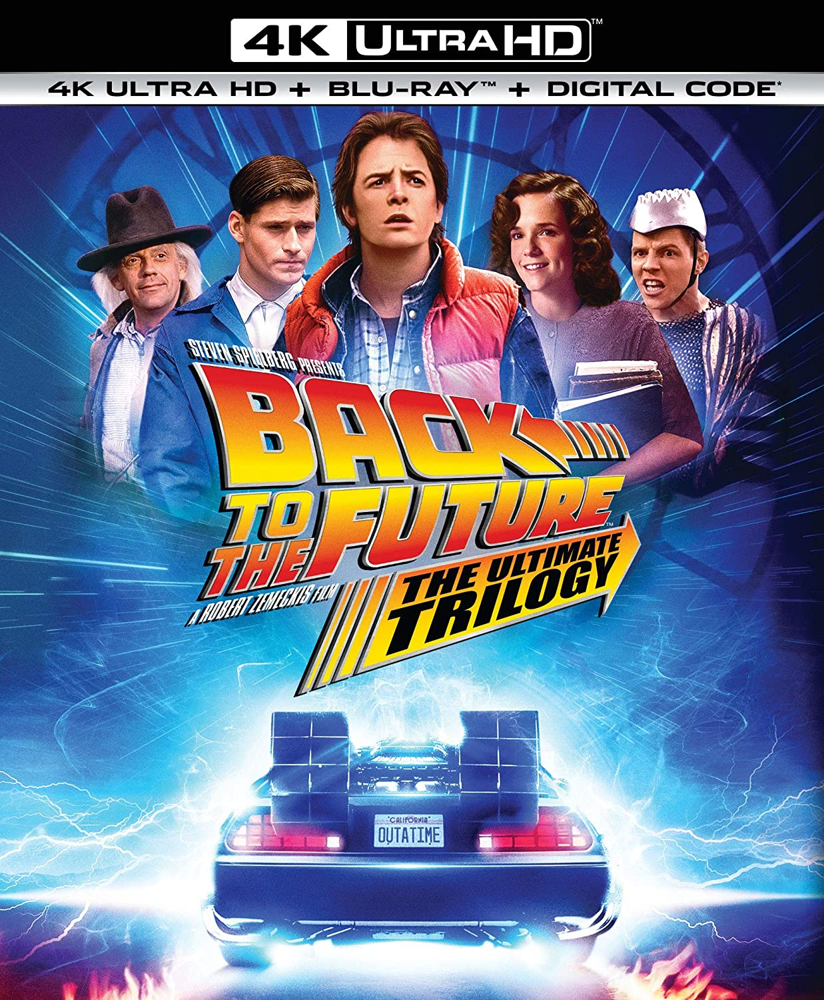

<br>
I could use embeddings or autoencoder to condence the poster into a vector. but also can extract entities from the poster, like: Spaceship, kids, etc.
    
    
<br><br><br>    
**As Asi instructed, I'll use only the genres.**
<br><br><br>
<br><br><br>

HyperParams: 

In [16]:
THRESHOLD = 3
NEGATIVE_WEIGHT = -0.25 # should be tuned for the optimal value
BINARY_RATING_OPTION = False
WITH_MOVIES_PROFILE_TFIDF = True

I'm going to use the explicit rating and the TFIDF approach!
<br><br><br>

User's Profiles Preparations:

In [17]:
# explicit or implicit
rating_column = 'rating'
if BINARY_RATING_OPTION:
    df_ratings['binary_rating'] = 0
    df_ratings.binary_rating[df_ratings.rating >= THRESHOLD] = 1
    df_ratings.binary_rating[df_ratings.rating < THRESHOLD] = NEGATIVE_WEIGHT
    rating_column = 'binary_rating'

# rating matrix    
ratings = df_ratings.pivot(columns = 'user_id', index ='item_id', values = rating_column)

# an empty user profile matrix
users_profile = pd.DataFrame(index=ratings.columns,columns=movies_profile.columns)
    
# TF-IDF - with or without
if WITH_MOVIES_PROFILE_TFIDF:
    df = movies_profile.sum()
    idf = (  (len(movies_profile)+1)/movies_profile.sum()  ).apply(np.log) #log inverse of DF
    movies_profile_tfidf = movies_profile.mul(idf.values)

    # dot product for movie profile matrix and each user - and then average on each genre  
    for idx,item in ratings.iteritems():
        users_profile.loc[idx] = movies_profile_tfidf.mul(item,axis=0).mean(axis=0)
else:        
    # dot product for movie profile matrix and each user - and then average on each genre  
    for idx,item in ratings.iteritems():
        users_profile.loc[idx] = movies_profile.mul(item,axis=0).mean(axis=0)

<br><br><br>

*a. Build a function which recommends 5 most relevant items to a user.*

In [18]:
def get_items_recommendations(user_profile,movies_profile,user_id,n=5):
    # user_id
    user_id -= 1
    
    # get a cosine similarity on all items
    cs_matrix = cosine_similarity(user_profile,movies_profile)
    
    # remove the actual item
    cs_matrix[user_id,user_id] = -1 
    
    # get the N-ids with the highest similarity
    cs_highest_ids  = cs_matrix[user_id].argsort()[::-1]
    if n>0:
        cs_highest_ids = cs_highest_ids[:n]
    
    # get the similarity values
    cs_highest_values = cs_matrix[user_id][cs_highest_ids]
    
    return cs_highest_ids,cs_highest_values

*b. Test your recommender system on 2 users. Explain your results.*


<br><br><br>
**First User:** (user number 9)
<br>

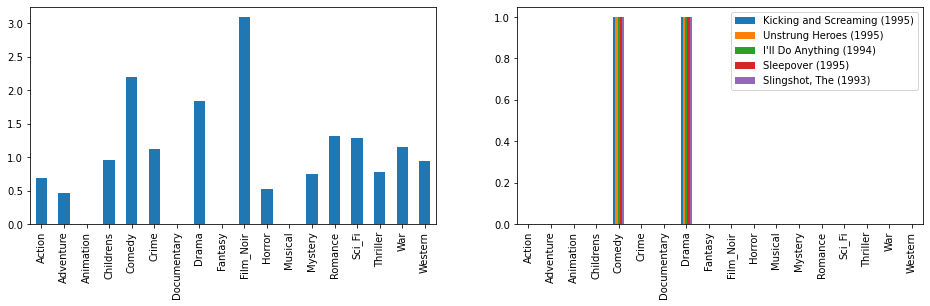

In [638]:
# user id
user_id = 9

# get recommendations
items, proba = get_items_recommendations(users_profile,movies_profile,user_id)

# plot
fig, axes = plt.subplots(ncols=2,figsize=(16,4))

# user's features
users_profile.loc[user_id].plot(kind='bar',ax=axes[0]);

# movies features
movies_profile.iloc[items].T.plot(kind='bar',ax=axes[1]);
plt.legend(df_items.loc[df_items.index.isin(items)].movie_title);

It easy to see that the user is fond of **Comedy & Drama**, and the movies recommended are from these generes.

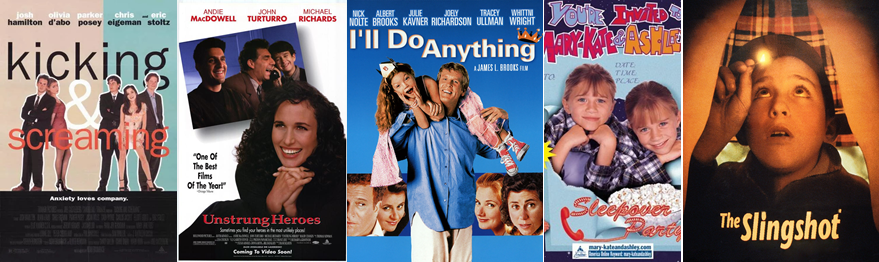

<br><br><br>
**Second User:**
<br>

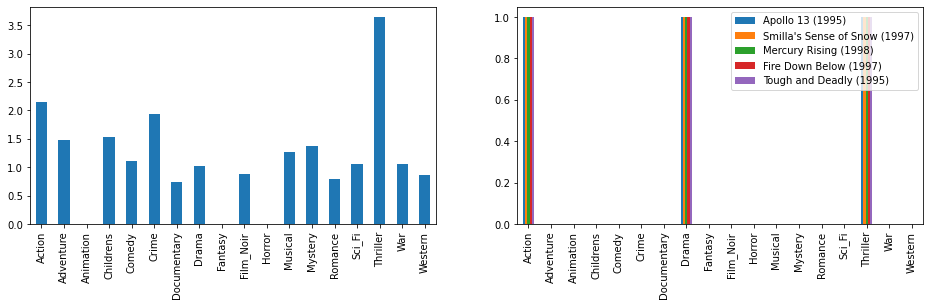

In [639]:
# user id
user_id = 4

# get recommendations
items, proba = get_items_recommendations(users_profile,movies_profile,user_id)

# plot
fig, axes = plt.subplots(ncols=2,figsize=(16,4))

# user's features
users_profile.loc[user_id].plot(kind='bar',ax=axes[0]);

# movies features
movies_profile.iloc[items].T.plot(kind='bar',ax=axes[1]);
plt.legend(df_items.loc[df_items.index.isin(items)].movie_title);

It easy to see that the user is mostly fond of Triller, but also **Drama & Action**, and the movies recommended are from these generes.

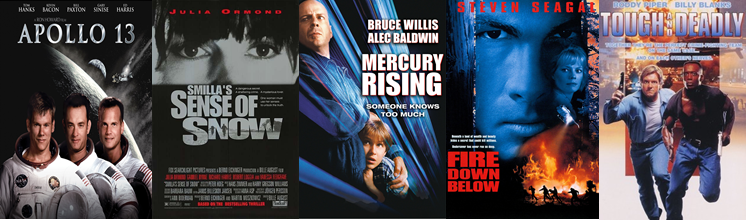

<br><br><br>

*c. Use the MRR metric to evaluate your recommender system on the test set. Use a cutoff value of 5.*


In [26]:
class eval_metrics():
    def __init__(self,train_df,pred_np,test_df,top_n=5):
        self.top_n = top_n
        
        # from np to df
        pred_df = pd.DataFrame(data=pred_np, index=train_df.index, columns=train_df.columns)
        
        # rows and cols in both
        rs = np.intersect1d(np.array(train_df.index),np.array(test_df.index))
        cs = np.intersect1d(np.array(train_df.columns),np.array(test_df.columns))
        
        # get relevent rows and clos
        actual = test_df.loc[rs,cs]
        predic = pred_df.loc[rs,cs]
        
        # get non-zeros values
        self.actual = actual[actual!=0]
        self.predic = predic[actual!=0]
       
    def MRR(self,top_n=5):
        self.top_n = top_n
        score = 0
        for p,t in zip(self.predic.iterrows(),self.actual.iterrows()):
            score += self.MRR_user(p[1],t[1])
        return score/self.predic.shape[0]
    
    def MRR_user(self,pred,test):
        i = pred.nlargest(self.top_n).index
        b = ((test[i] >=3) & (pred[i] >=3)).reset_index(drop=True)
        if len(b[b==1])==0:
            return 0
        RR = ((b.nlargest(1).index+1).values[0])
        return 1/RR
        
                             
em = eval_metrics(train,mf.predict_all(),test)
em.MRR()

yoyo


In [56]:
def MRR(users_profile,movies_profile,test,n_top=5):
    score = []
    for user_id,t in test.iterrows():

        # user in trainset
        if ~np.isin(user_id,users_profile.index):
            continue;
            
        t_v = t[t!=0]
        # user has ratings
        if len(t_v)==0:
            continue
            
        p, _ = get_items_recommendations(users_profile,movies_profile,user_id,n=-1)
        p = p[np.isin(p,t_v.index)][:n_top]
        t_v_n = t_v.nlargest(n_top).index
        
        b = np.isin(p,t_v_n)
        
        if b.sum()>0:
            score.append(1/(b.argmax()+1))
        else:
            score.append(0)
            
    return np.mean(score)

A 'pipeline' to get MRR score on all folds: 

In [57]:
dfs = {i:
       {'train' : pd.read_csv('{}u{}.base'.format(data_dir,i), delimiter='\t', header=None, names=cols_data),
        'test'  : pd.read_csv('{}u{}.test'.format(data_dir,i), delimiter='\t', header=None, names=cols_data)
       } for i in range(1,6)} 

def df2matrix(i):
    train = dfs[i]['train'].pivot(index = 'user_id', columns ='item_id', values = 'rating').fillna(0)
    test  = dfs[i]['test'].pivot(index = 'user_id', columns ='item_id', values = 'rating').fillna(0)
    return train,test 


def get_MRR_score(n_top=5,THRESHOLD = 3,NEGATIVE_WEIGHT = -0.25,BINARY_RATING_OPTION = False,WITH_MOVIES_PROFILE_TFIDF = True):
    
    end = time.time()
    MRR_mean = 0
    
    for fold_n in range(1,6):
        train,test = df2matrix(fold_n)
        train = train.T

        # an empty user profile matrix
        users_profile = pd.DataFrame(index=train.columns,columns=movies_profile.columns)

        # TF-IDF - with or without
        if WITH_MOVIES_PROFILE_TFIDF:
            df = movies_profile.sum()
            idf = (  (len(movies_profile)+1)/movies_profile.sum()  ).apply(np.log) #log inverse of DF
            movies_profile_tfidf = movies_profile.mul(idf.values)

            # dot product for movie profile matrix and each user - and then average on each genre  
            for idx,item in ratings.iteritems():
                users_profile.loc[idx] = movies_profile_tfidf.mul(item,axis=0).mean(axis=0)
        else:        
            # dot product for movie profile matrix and each user - and then average on each genre  
            for idx,item in ratings.iteritems():
                users_profile.loc[idx] = movies_profile.mul(item,axis=0).mean(axis=0)

        MRR_mean += MRR(users_profile,movies_profile,test,n_top) 
    
    return MRR_mean/5, (time.time() - end)/10/60

Averaging the MRR score over all the folds:

The MRR5 is:  0.6229956380364264
The MRR10 is:  0.7904866832101336


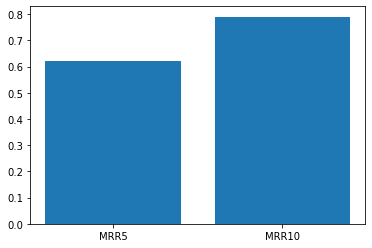

In [58]:
mrr5,time5 = get_MRR_score(n_top=5)
# mrr10,time10 = get_MRR_score(n_top=10)

print('The MRR5 is: ' ,mrr5)
print('The MRR10 is: ' ,mrr10)

plt.bar(x=['MRR5','MRR10'],height=[mrr5,mrr10]);

Due to the way MRR is defined, it make a lot of sense that MRR10 will get a higher score then MRR5 for content based.  
While this issue is not as notable in the MF approach.


<br><br>

<br><br><br><br>

*d. Compare the results of the content based recommender system to the matrix factorization recommender system using the same train and test set. Use the MRR metric for the comparison.*

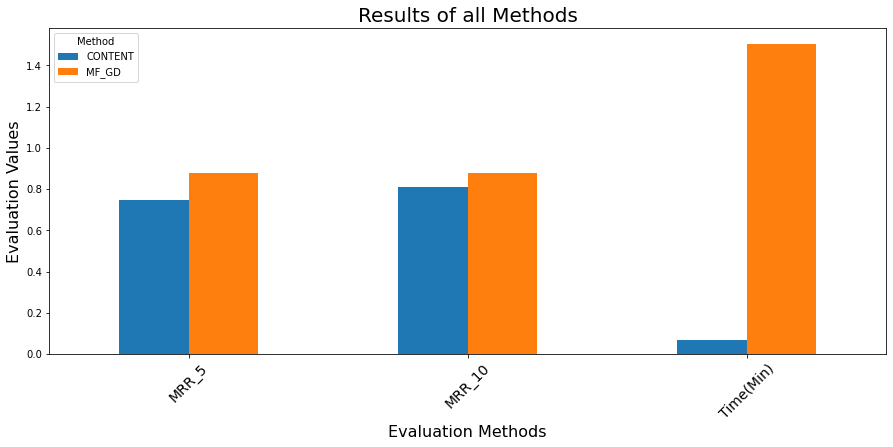

,MRR_5,MRR_10,Time(Min)
Method,,,
CONTENT,0.746599,0.811137,0.069577
MF_GD,0.879644,0.880312,1.506360


In [29]:
final_results = pd.DataFrame(columns=['Method','MRR_5','MRR_10','Time(Min)'])

final_results = final_results.append({'Method':'CONTENT','MRR_5':mrr5,'MRR_10':mrr10,'Time(Min)':(time5+time10)/2},ignore_index=True)
final_results = final_results.append({ 'Method':'MF_GD','MRR_5':0.879644,'MRR_10':0.880312,'Time(Min)':1.506360},ignore_index=True)

final_results = final_results.set_index('Method')


final_results.T.plot(kind="bar", figsize=(15,6))
plt.title("Results of all Methods", fontsize=20)
plt.xlabel("Evaluation Methods", fontsize=16)
plt.ylabel("Evaluation Values", fontsize=16)
plt.xticks(fontsize=14, rotation=45)
plt.show();

final_results

As it easy to to that the content base is fast compare to MF-GD.  
But it does not achieve as good on the MRR score.  

Compare to **matrix factorization with Gradient Decent**, the content base recommender system is not as good.  
But if I add to the cosideretion the time aspect, it give a nice result.   
<br><br><br><br>

*e. Discuss the advantages and disadvantages of matrix factorization vs. content based recommender systems (refer to accuracy, complexity, explainaiblity and new user\new items) and when will you recommend using each approach.*

<br><br><br>


<table>
    <thead>
        <tr>
            <th>..</th>
            <th style="text-align:center">Content-Based</th>
            <th style="text-align:center">Matrix-Factorization</th>
            <th  style="text-align:left">Notes:</th>
        </tr>
    </thead>
    <tbody>
        <tr>
            <td>Dimentinality</td>
            <td style="text-align:center">Number of Features - can be predefined by a domain expert</td>
            <td style="text-align:center">Defined by the number of items & users</td>
        </tr>
        <tr>
            <td>Similarity</td>
            <td style="text-align:center">Based on content features<br></td>
            <td style="text-align:center">Based on users ratings</td>
        </tr>
        <tr>
            <td>Accuracy</td>
            <td style="text-align:center">mid</td>
            <td style="text-align:center">high</td>   
            <td style="text-align:left">This is a relative aspect, and this is the result in our case.<br>We can improve the CB with feature engineering</td>
        </tr>
        <tr>
            <td>Accuracy Over Time</td>
            <td style="text-align:center">Same</td>
            <td style="text-align:center">Improve</td>   
            <td style="text-align:left">While our system in being used, the MF will eventually outperformed the CB significantly</td>
        </tr>
        <tr>
            <td>Complexity</td>
            <td style="text-align:center">Quite Simple</td>
            <td style="text-align:center">Quite complex</td>
            <td style="text-align:left">The usage of thing like GD makes the MF complex, while the CB is much more simple</td>
        </tr>
        <tr>
            <td>Explanability</td>
            <td style="text-align:center">Simple</td>
            <td style="text-align:center">Hard</td>     
            <td style="text-align:left">CB will be easy to find out "why" we reccommended the Item to the user.<br> But the MF is much harder due to the latent space we're in.</td>
        </tr>
        <tr>
            <td>Scalability</td>
            <td style="text-align:center">Easily Scalable</td>
            <td style="text-align:center">Not-Easily Scalable</td>
            <td style="text-align:left">In order to mke the MF scale to the milions, u will need a lot of computetional power, and use parallel,GPUs, etc.</td>
        </tr>        
        <tr>
            <td>New User</td>
            <td style="text-align:center">Cold Start</td>
            <td style="text-align:center">Cold Start</td>    
            <td style="text-align:left">In both approachs we need some data about the users, in order to find what he likes.<br> CB needs to extract the features that relevant to the user, and MF needs to "compare" the user's ratings with other user's ratings. <br>To combat this we can let every new user to initial the system with some ratings appon arrival</td>    
        </tr>
        <tr>
            <td>New Item</td>
            <td style="text-align:center">Warm Start :)) </td>
            <td style="text-align:center">Cold Start</td> 
            <td style="text-align:left">MF needs the item to be rated, while CB just append the new item to the dataset and extarct it's features from the actual content of the new item.</td>
        </tr>
        <tr>
            <td>Train Time</td>
            <td style="text-align:center">Short</td>
            <td style="text-align:center">Long</td>     
        </tr>
        <tr>
            <td>Predict Time</td>
            <td style="text-align:center">Short</td>
            <td style="text-align:center">Short</td>     
        </tr>
        <tr>
            <td>Randomness</td>
            <td style="text-align:center">Not Effected</td>
            <td style="text-align:center">Effected</td>
            <td style="text-align:left">For multiple different runs the can predict different results, while CB will give the same results.</td>
        </tr>
        <tr>
            <td>Trands</td>
            <td style="text-align:center">Not Effected</td>
            <td style="text-align:center">Not Effected</td>
            <td style="text-align:left">Both classical approach for CB and MF won't generalize good for trens. While the CB could be changed a bit to adapte to trands.</td>
        </tr>
        <tr>
            <td>Tradoff</td>
            <td  style="text-align:center">A good Baseline, due to short training time and nice scores</td>
            <td style="text-align:center">Preform well, and the scores worth the long training time</td>
            <td style="text-align:left"
                >I guess an approach that combines the two will be most benificial. For example, use the CB for new items in order to get users to rate them, and then have some data for the MF.</td>
        </tr>
    </tbody>
</table>


**What I'll Choose?**

After investegate and test both approachs, the significat difference between them needs to be based on the **needs of our recommended system** .

If I'm in need of something that works - I'll just use **popolarity.**  
If I'm in need of something that scale & explianable - I'll use **content-base**  
If I'm in need of something that be the most accurate - I'll use **matrix factorization.**  
If I'm in need of something that handle new items and new users - I'll use an **hybrid approach.**  

<br><br><br>
<br><br><br>

### Good luck